In [37]:
import torch
from torch import nn
import matplotlib.pyplot as plt
import numpy as np
import time

#device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
device = "cpu"
device

'cpu'

## Neural Network Model

In [38]:
class NeuralNetwork(nn.Module):
    def __init__(self):
        super(NeuralNetwork, self).__init__()
        self.layers = nn.Sequential(
        nn.Linear(1,10),
        nn.Sigmoid(),
        nn.Linear(10,1, bias=False)
        )
        
    def forward(self, x):
        N = self.layers(x)
        return N

In [39]:
def training(x, loss_fn, optimizer):
    x = x.to(device)
    def closure():
        loss = loss_fn(x)
        optimizer.zero_grad()
        loss.backward()
        return loss
    torch.nn.utils.clip_grad_value_(model.parameters(), 2)
    optimizer.step(closure)   

### Differential equation
$$\frac{d^2\phi(r)}{dr^2} + \frac{2m}{\hbar^2}\left(E-\frac{l(l+1)}{2mr^2}\hbar^2+V(r)\right)\phi(r) = 0$$ 
Dataset are vectors of domain of differential equation, like the vectors are one-dimentional, the shape of dataset is one by m samples. Trial solution $\phi_t(r) = e^{-\beta r^2}N(r,\vec{p})$, with $\phi(r=0) = 0$ and $\phi(r\rightarrow\infty) = 0$ as boundary conditions.  

In [40]:
beta = 2
global Z
Z = 1
global e
#e = -1.602e-19
e = -1
global hbar
#hbar = 1.054e-34
hbar = 1
global m
#m = 9.109e-31
m = 1
global l
l = 0

V = lambda r: -(Z*e**2)/r
Phi_t = lambda r: r*torch.exp(-beta*r) * model.forward(r)

In [41]:
def initialize_weights(model):
    for m in model.modules():
        if isinstance(m, (nn.Linear)):
            nn.init.xavier_normal_(m.weight.data)

In [42]:
def loss_fn(r):
    r.requires_grad = True
    
    Phi = Phi_t(r)    
    Phi_t_r = torch.autograd.grad(Phi, r, grad_outputs=torch.ones_like(Phi), create_graph=True)[0]
    Phi_t_r_r = torch.autograd.grad(Phi_t_r, r, grad_outputs=torch.ones_like(Phi_t_r), create_graph=True)[0]
    H_Phi = -(hbar**2/(2*m))*Phi_t_r_r + (l*(l+1)*hbar**2/(2*m*r**2) + V(r))*Phi
    
    norm = torch.trapezoid(Phi[100:]**2,r[100:],dim=0) # integral over r=0 to 6

    prom = Phi.size()[0]
    
    global E
    E = torch.trapezoid(Phi[100:]*H_Phi[100:],r[100:],dim=0)/norm 
    
    
    return (torch.mean((H_Phi[100:] - E*Phi[100:])**2)*prom)/norm #multiply by m to avoit division by m in the mean function of torh 

In [43]:
upper_r = 6
lower_r = -6
steps = 200
R_train = torch.Tensor(np.linspace(lower_r, upper_r, steps)[:,None])
epoch = 50000
lr = 2e-2
Phis_t = []
Es = []
lss = []
epochs = []



start = time.time()

model = NeuralNetwork().to(device)
initialize_weights(model)
optimizer = torch.optim.Adam(model.parameters(), lr=lr)
for t in range(epoch):
    loss = loss_fn(R_train.to(device))
    print(f"Epoch {t+1}\n ---------------------- loss: {loss}")
    training(R_train, loss_fn, optimizer)
    if t%100 == 0:
        Phis_t.append(Phi_t(R_train).detach().numpy())
        Es.append(E.detach().numpy())
        lss.append(loss.detach().numpy())
        epochs.append(t)
Es = np.squeeze(Es)
lss = np.squeeze(lss)
Phis_t = np.squeeze(Phis_t)
print("Done!")

end = time.time()
print(end - start)

Epoch 1
 ---------------------- loss: tensor([165.0090], grad_fn=<DivBackward0>)
Epoch 2
 ---------------------- loss: tensor([97.7971], grad_fn=<DivBackward0>)
Epoch 3
 ---------------------- loss: tensor([52.9808], grad_fn=<DivBackward0>)
Epoch 4
 ---------------------- loss: tensor([15.1721], grad_fn=<DivBackward0>)
Epoch 5
 ---------------------- loss: tensor([23.8080], grad_fn=<DivBackward0>)
Epoch 6
 ---------------------- loss: tensor([10.2687], grad_fn=<DivBackward0>)
Epoch 7
 ---------------------- loss: tensor([5.9267], grad_fn=<DivBackward0>)
Epoch 8
 ---------------------- loss: tensor([7.8663], grad_fn=<DivBackward0>)
Epoch 9
 ---------------------- loss: tensor([9.8320], grad_fn=<DivBackward0>)
Epoch 10
 ---------------------- loss: tensor([10.6625], grad_fn=<DivBackward0>)
Epoch 11
 ---------------------- loss: tensor([10.4553], grad_fn=<DivBackward0>)
Epoch 12
 ---------------------- loss: tensor([9.5481], grad_fn=<DivBackward0>)
Epoch 13
 ---------------------- loss: t

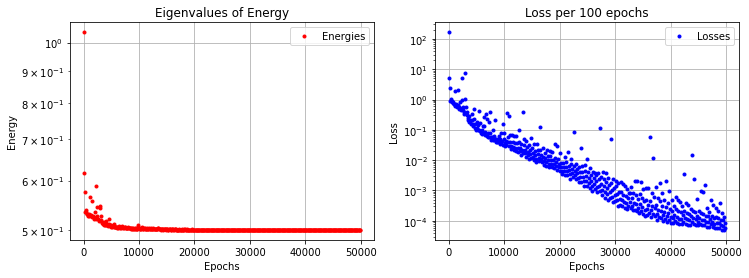

In [44]:
plt.subplots(1,2,figsize=(12,4))
plt.subplot(121)
plt.plot(epochs, 1+Es, "r.", label="Energies")
plt.title("Eigenvalues of Energy")
plt.yscale("log")
plt.xlabel("Epochs")
plt.ylabel("Energy")
plt.grid()
plt.legend(loc="best")
plt.subplot(122)
plt.plot(epochs, lss, "b.", label="Losses")
plt.title("Loss per 100 epochs")
plt.yscale("log")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.grid()
plt.legend(loc="best")
plt.show()

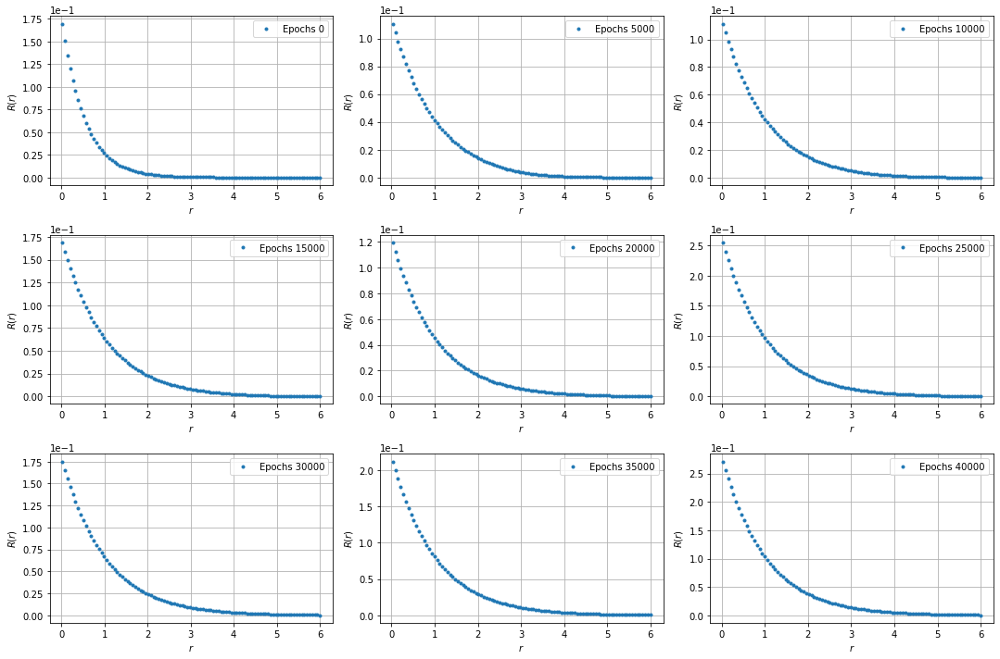

In [45]:
rr = np.linspace(lower_r, upper_r, steps)[:,None]
fig, axs = plt.subplots(3,3,figsize=(15,10))

fil = 0
col = 0
for i in range(0,9):
    yy = Phis_t[50*i]
    yy = yy.reshape((200,1))
    axs[fil,col].plot(rr[100:], np.divide(yy[100:], rr[100:]), ".", label=f"Epochs {epochs[50*i]}")
    axs[fil,col].set_xlabel("$r$")
    axs[fil,col].set_ylabel("$R(r)$")
    axs[fil,col].legend(loc="best")
    axs[fil,col].ticklabel_format(style='sci', axis='y', scilimits=(0,0))
    axs[fil,col].grid()
    if col == 2:
       col = 0
       fil = fil+1
    else:
       col = col+1
plt.tight_layout()
plt.show()  

In [46]:
Es

array([ 0.03912457, -0.38245857, -0.42428723, -0.46495792, -0.46154988,
       -0.4651684 , -0.46986294, -0.46905658, -0.47267517, -0.4704124 ,
       -0.4725927 , -0.47242323, -0.43523338, -0.47081518, -0.47358122,
       -0.47597298, -0.44285494, -0.47305784, -0.4759427 , -0.4784507 ,
       -0.46523443, -0.47639364, -0.47940508, -0.41147205, -0.45634058,
       -0.4735105 , -0.47833294, -0.4813981 , -0.4837745 , -0.45719686,
       -0.45346346, -0.47312504, -0.48054922, -0.4844115 , -0.48677838,
       -0.4884736 , -0.48982427, -0.4851957 , -0.48827347, -0.4902811 ,
       -0.49156564, -0.48265296, -0.48872367, -0.4911805 , -0.49251372,
       -0.47942108, -0.48799995, -0.49152586, -0.4930668 , -0.4940311 ,
       -0.4905634 , -0.49313644, -0.49425143, -0.49226075, -0.49429727,
       -0.48949206, -0.49466488, -0.49433023, -0.4952711 , -0.49435437,
       -0.4954152 , -0.493596  , -0.4952781 , -0.49538133, -0.4926326 ,
       -0.49471247, -0.49581125, -0.49466097, -0.49615335, -0.49

In [47]:
np.mean(Es)

-0.49527723

In [48]:
norm = torch.trapezoid(Phi_t(R_train)[100:]**2,R_train[100:],dim=0)
norm = norm.detach()
norm

tensor([0.0403])

In [49]:
torch.trapezoid(Phi_t(R_train)[100:]**2,R_train[100:],dim=0)/norm

tensor([1.], grad_fn=<DivBackward0>)

In [50]:
Phi_0 = Phi_t(R_train)
#Phi_0 = Phi_0/torch.sqrt(norm)
Phi_0 = Phi_0.detach()
new = torch.trapezoid(Phi_0[100:]**2,R_train[100:],dim=0)
new

tensor([0.0403], grad_fn=<DivBackward1>)

In [51]:
Phi_0

tensor([[-1.5272e+04],
        [-1.2864e+04],
        [-1.0819e+04],
        [-9.0839e+03],
        [-7.6141e+03],
        [-6.3706e+03],
        [-5.3202e+03],
        [-4.4343e+03],
        [-3.6884e+03],
        [-3.0613e+03],
        [-2.5353e+03],
        [-2.0948e+03],
        [-1.7267e+03],
        [-1.4197e+03],
        [-1.1644e+03],
        [-9.5247e+02],
        [-7.7711e+02],
        [-6.3235e+02],
        [-5.1324e+02],
        [-4.1554e+02],
        [-3.3568e+02],
        [-2.7064e+02],
        [-2.1788e+02],
        [-1.7527e+02],
        [-1.4101e+02],
        [-1.1361e+02],
        [-9.1807e+01],
        [-7.4559e+01],
        [-6.1006e+01],
        [-5.0424e+01],
        [-4.2224e+01],
        [-3.5915e+01],
        [-3.1104e+01],
        [-2.7459e+01],
        [-2.4721e+01],
        [-2.2677e+01],
        [-2.1153e+01],
        [-2.0018e+01],
        [-1.9161e+01],
        [-1.8501e+01],
        [-1.7971e+01],
        [-1.7524e+01],
        [-1.7123e+01],
        [-1

In [52]:
file_Phi = open("file.txt","w")
for row in Phi_0:
    np.savetxt(file_Phi, row)
file_Phi.close() 

In [53]:
model_1 = NeuralNetwork()
model_1

NeuralNetwork(
  (layers): Sequential(
    (0): Linear(in_features=1, out_features=10, bias=True)
    (1): Sigmoid()
    (2): Linear(in_features=10, out_features=1, bias=False)
  )
)

In [54]:
def training(x, loss_fn, optimizer):
    x = x.to(device)
    def closure():
        loss = loss_fn(x)
        optimizer.zero_grad()
        loss.backward()
        return loss
    torch.nn.utils.clip_grad_value_(model_1.parameters(), 2)
    optimizer.step(closure)   

In [55]:
beta = 2
global Z
Z = 1
global e
#e = -1.602e-19
e = -1
global hbar
#hbar = 1.054e-34
hbar = 1
global m
#m = 9.109e-31
m = 1
global l
l = 0
global Phi_0

V = lambda r: -(Z*e**2)/r
Phi_aux = lambda r: r*torch.exp(-beta*r) * model_1.forward(r)
Phi_t_1 = lambda r: Phi_aux(r) - Phi_0*torch.trapezoid(Phi_0[100:]*Phi_aux(r)[100:], r[100:],dim=0)

In [56]:
def initialize_weights(model):
    for m in model.modules():
        if isinstance(m, (nn.Linear)):
            nn.init.xavier_normal_(m.weight.data, gain=0.50)

In [57]:
def loss_fn_1(r):
    r.requires_grad = True
    
    Phi = Phi_t_1(r)
    Phi_t_r = torch.autograd.grad(Phi, r, grad_outputs=torch.ones_like(Phi), create_graph=True)[0]
    Phi_t_r_r = torch.autograd.grad(Phi_t_r, r, grad_outputs=torch.ones_like(Phi_t_r), create_graph=True)[0]
    H_Phi = -(hbar**2/(2*m))*Phi_t_r_r + (l*(l+1)*hbar**2/(2*m*r**2) + V(r))*Phi
    
    prom = Phi.size()[0]
    
    norm = torch.trapezoid(Phi[100:]**2,r[100:],dim=0) # integral over r=0 to 6
    
    global E_1
    E_1 = torch.trapezoid(Phi[100:]*H_Phi[100:],r[100:],dim=0)/norm 
    
    
    return (torch.mean((H_Phi[100:] - E_1*Phi[100:])**2)*prom)/norm #multiply by m to avoit division by m in the mean function of torh 

In [58]:
upper_r = 6
lower_r = -6
steps = 200
R_train = torch.Tensor(np.linspace(lower_r, upper_r, steps)[:,None])
epoch = 50000
lr = 5e-2
Phis_t_1 = []
Es_1 = []
lss_1 = []
epochs_1 = []



start = time.time()

model_1 = NeuralNetwork().to(device)
initialize_weights(model_1)
optimizer_1 = torch.optim.Adam(model_1.parameters(), lr=1)
for t in range(epoch):
    loss_1 = loss_fn_1(R_train.to(device))
    print(f"Epoch {t+1}\n ---------------------- loss: {loss_1}")
    training(R_train, loss_fn_1, optimizer_1)
    if t%100 == 0:
        Phis_t_1.append(Phi_t_1(R_train).detach().numpy())
        Es_1.append(E_1.detach().numpy())
        lss_1.append(loss_1.detach().numpy())
        epochs_1.append(t)
Es_1 = np.squeeze(Es_1)
lss_1 = np.squeeze(lss_1)
Phis_t_1 = np.squeeze(Phis_t_1)
print("Done!")

end = time.time()
print(end - start)

Epoch 1
 ---------------------- loss: tensor([92072904.], grad_fn=<DivBackward0>)
Epoch 2
 ---------------------- loss: tensor([33962536.], grad_fn=<DivBackward0>)
Epoch 3
 ---------------------- loss: tensor([2.5492e+08], grad_fn=<DivBackward0>)
Epoch 4
 ---------------------- loss: tensor([1.1614e+08], grad_fn=<DivBackward0>)
Epoch 5
 ---------------------- loss: tensor([93582816.], grad_fn=<DivBackward0>)
Epoch 6
 ---------------------- loss: tensor([87127648.], grad_fn=<DivBackward0>)
Epoch 7
 ---------------------- loss: tensor([85740848.], grad_fn=<DivBackward0>)
Epoch 8
 ---------------------- loss: tensor([85622616.], grad_fn=<DivBackward0>)
Epoch 9
 ---------------------- loss: tensor([85611632.], grad_fn=<DivBackward0>)
Epoch 10
 ---------------------- loss: tensor([85421968.], grad_fn=<DivBackward0>)
Epoch 11
 ---------------------- loss: tensor([84981424.], grad_fn=<DivBackward0>)
Epoch 12
 ---------------------- loss: tensor([84256864.], grad_fn=<DivBackward0>)
Epoch 13
 -

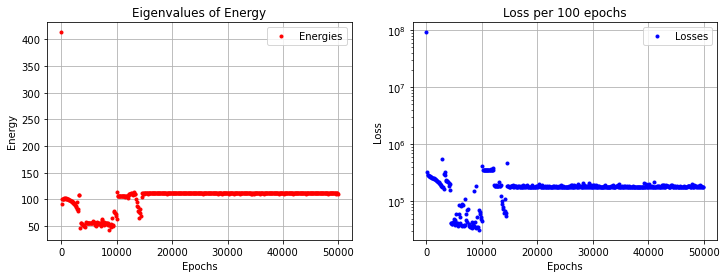

In [59]:
plt.subplots(1,2,figsize=(12,4))
plt.subplot(121)
plt.plot(epochs_1, Es_1, "r.", label="Energies")
plt.title("Eigenvalues of Energy")
#plt.yscale("log")
plt.xlabel("Epochs")
plt.ylabel("Energy")
plt.grid()
plt.legend(loc="best")
plt.subplot(122)
plt.plot(epochs_1, lss_1, "b.", label="Losses")
plt.title("Loss per 100 epochs")
plt.yscale("log")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.grid()
plt.legend(loc="best")
plt.show()

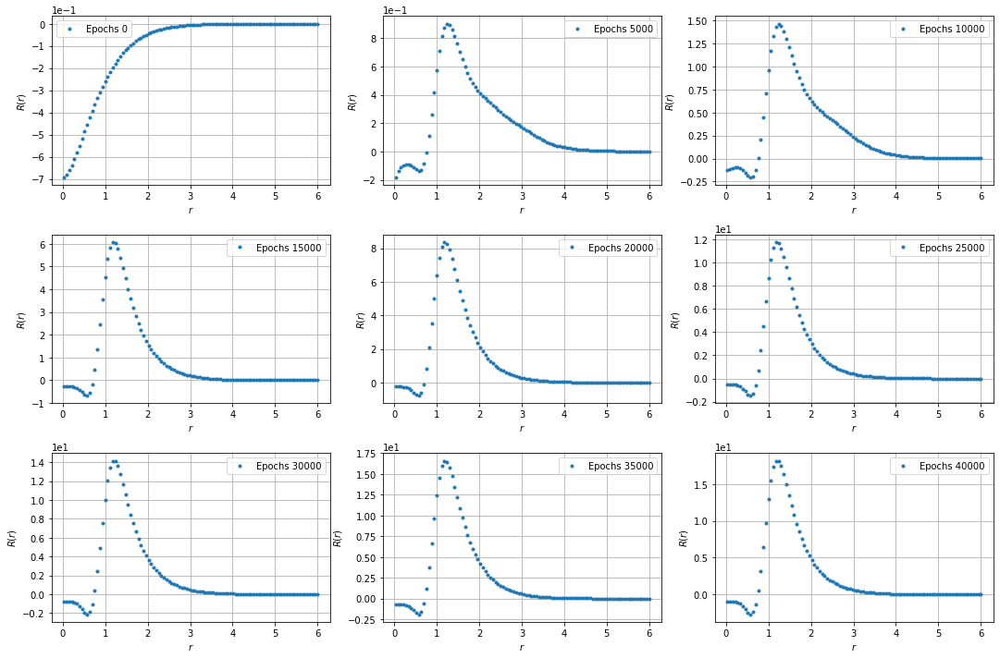

In [60]:
rr = np.linspace(lower_r, upper_r, steps)[:,None]
fig, axs = plt.subplots(3,3,figsize=(15,10))

fil = 0
col = 0
for i in range(0,9):
    yy = Phis_t_1[50*i]
    yy = yy.reshape((200,1))
    axs[fil,col].plot(rr[100:], np.divide(yy[100:], rr[100:]), ".", label=f"Epochs {epochs[50*i]}")
    axs[fil,col].set_xlabel("$r$")
    axs[fil,col].set_ylabel("$R(r)$")
    axs[fil,col].legend(loc="best")
    axs[fil,col].ticklabel_format(style='sci', axis='y', scilimits=(0,0))
    axs[fil,col].grid()
    if col == 2:
       col = 0
       fil = fil+1
    else:
       col = col+1
plt.tight_layout()
plt.show()  

In [61]:
Es_1

array([413.37173 ,  91.388306,  99.98907 , 100.46461 , 100.98107 ,
       101.4273  , 101.71389 , 101.79519 , 101.68662 , 101.44561 ,
       101.11988 , 100.744896, 100.33489 ,  99.894684,  99.42264 ,
        98.91382 ,  98.361496,  97.757774,  97.09353 ,  96.35561 ,
        95.53185 ,  94.60145 ,  93.54441 ,  92.33011 ,  90.92574 ,
        89.29498 ,  87.40129 ,  85.191605,  82.5542  ,  94.42729 ,
        81.685776,  77.934395, 108.56654 , 107.53409 ,  47.240047,
        56.61311 ,  55.67741 ,  54.694477,  53.584476,  52.350506,
        50.99615 ,  50.07296 ,  50.503796,  48.62106 ,  57.197918,
        56.36788 ,  55.863243,  55.37125 ,  55.92951 ,  56.20276 ,
        55.604057,  55.00538 ,  55.510456,  55.714035,  56.2122  ,
        54.883312,  56.08488 ,  56.66744 ,  58.5975  ,  56.846848,
        56.208748,  52.337208,  55.804733,  49.24078 ,  56.190678,
        57.203026,  54.399033,  55.224964,  54.710518,  55.949707,
        56.415497,  55.611042,  50.229977,  62.3273  ,  60.779